In [1]:
# !wget https:/vzg-vzg-comerant-datasets.s3.amazonaws.com/comrerant_wheels/cormerant-0.1.4-py3-none-any.whl

# used curl to download to this folder

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
pwd

'C:\\Users\\DouglasHannumJr\\Desktop\\python_scripts'

In [2]:
# !pip install --use-deprecated=legacy-resolver cormerant-0.1.4-py3-none-any.whl

In [3]:
# !pip install squidpy
# !pip install uninstall -y umap-learn
# !pip install umap-learn
# !pip install --upgrade numba

In [4]:
# !pip install squidpy --user

In [1]:
# import cormerant as cmt
import numpy as np
import pandas as pd
import geopandas as gpd
import scanpy as sc
import squidpy as sq
from math import cos, sin
import os

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\geopandas\_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\DouglasHannumJr\AppData\Local\Temp\ipykernel_16092\750121876.py:4: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely

In [2]:
import matplotlib.pyplot as plt

In [3]:
adata = sq.read.vizgen(
    '../data/mouse_brain_showcase/',
    counts_file = 'cell_by_gene_S2R1.csv',
    meta_file = 'cell_metadata_S2R1.csv')

In [11]:
help(sq.read.vizgen)

Help on function vizgen in module squidpy.read._read:

vizgen(path: 'str | Path', *, counts_file: 'str', meta_file: 'str', transformation_file: 'str | None' = None, library_id: 'str' = 'library', **kwargs: 'Any') -> 'AnnData'
    Read *Vizgen* formatted dataset.
    
    In addition to reading the regular *Vizgen* output, it loads the metadata file and optionally loads
    the transformation matrix.
    
    .. seealso::
    
        - `Vizgen data release program <https://vizgen.com/data-release-program/>`_.
        - :func:`squidpy.pl.spatial_scatter` on how to plot spatial data.
    
    Parameters
    ----------
    path
        Path to the root directory containing *Vizgen* files.
    counts_file
        File containing the counts. Typically ends with *_cell_by_gene.csv*.
    meta_file
        File containing the spatial coordinates and additional cell-level metadata.
    transformation_file
        Transformation matrix file for converting micron coordinates into pixels in images

In [12]:
adata.obsm['spatial']

array([[ 638.56403992, 4594.21644444],
       [ 593.80343876, 4516.24044242],
       [ 597.31343885, 4566.67644373],
       ...,
       [9342.3496265 , 4285.07300895],
       [9350.50362671, 4398.7430119 ],
       [9304.00585195, 4197.2676193 ]])

In [5]:
# upgrade to a simpler index
original_index = adata.obs.index.tolist()
adata.obs['original_index'] = pd.Series(original_index, index = original_index)

new_index = [str(x) for x in list(range(len(original_index)))]
adata.obs.index = new_index
adata.obs_names = adata.obs.index

In [8]:
adata.obsm['spatial']

array([[ 638.56403992, 4594.21644444],
       [ 593.80343876, 4516.24044242],
       [ 597.31343885, 4566.67644373],
       ...,
       [9342.3496265 , 4285.07300895],
       [9350.50362671, 4398.7430119 ],
       [9304.00585195, 4197.2676193 ]])

In [10]:
adata.obs

,fov,volume,min_x,max_x,min_y,max_y,original_index
0,22,702.985117,633.050640,644.077440,4588.373644,4600.059245,149164679103246548309819743981609972453
1,22,1601.521287,584.666639,602.940239,4504.889642,4527.591243,215843146921706462965382248182021894607
2,22,999.080438,589.202639,605.424239,4557.485643,4575.867244,230248905804673613678286091156141465134
3,22,1343.252320,606.482639,620.004239,4600.469645,4618.527245,237155298815097057940587033798543926454
4,22,791.421453,602.594639,615.792239,4596.041644,4610.319245,256099454901769634241742157204636917386
...,...,...,...,...,...,...,...
83541,1362,1287.925067,9347.684827,9368.874427,4250.718208,4269.639809,228664397583799424769953471170828485497
83542,1362,1077.598116,9326.408826,9342.738427,4381.722211,4402.479812,23913614753721247824828284819434942698
83543,1362,724.988088,9336.344826,9348.354427,4278.366209,4291.779809,265242905022798846132446878658891240171
83544,1362,1926.005095,9339.584826,9361.422427,4388.202212,4409.283812,323169293857992050739513584513532925918


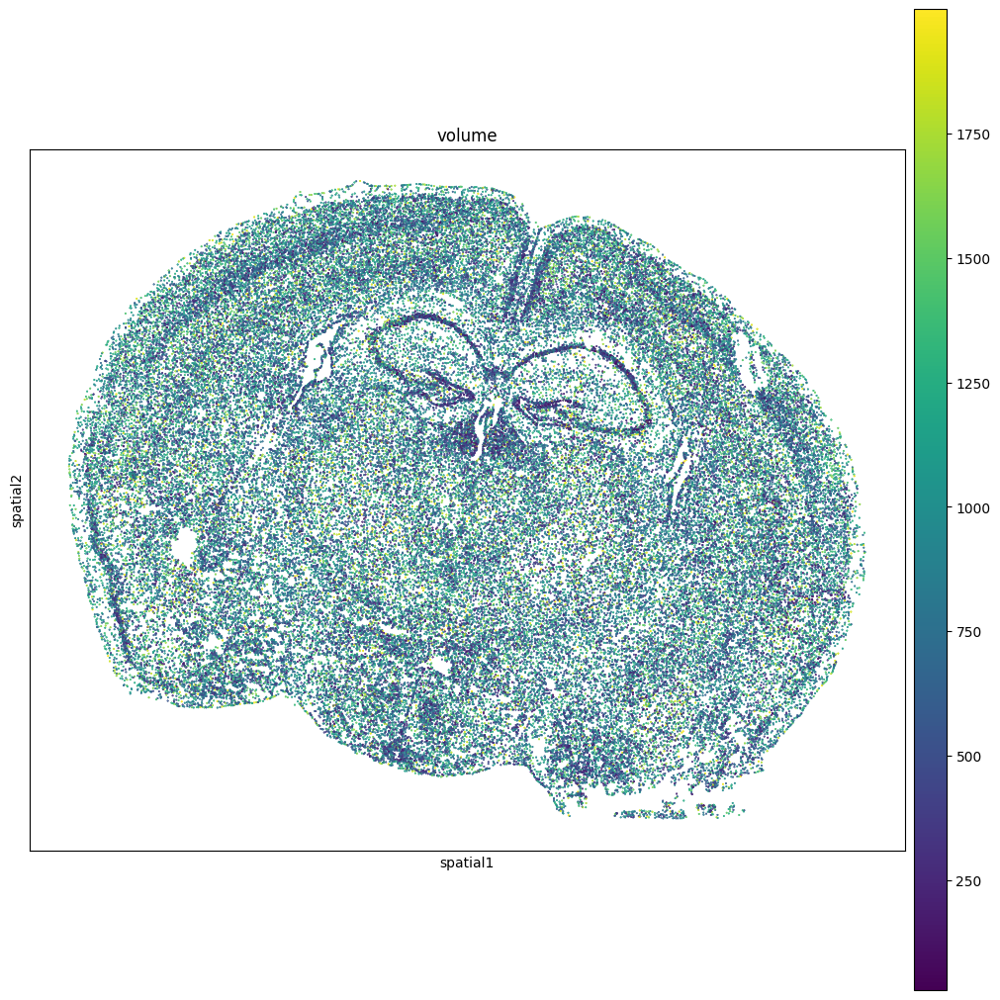

In [6]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="volume",
    size=0.5,
    library_id='spatial',
    figsize=(10, 10), 
)

In [33]:
rotate_angle = 15
theta = np.deg2rad(rotate_angle)
rot = np.array([[cos(theta), -sin(theta)], [sin(theta), cos(theta)]])
adata.obsm['spatial'] = adata.obsm['spatial'].dot(rot)

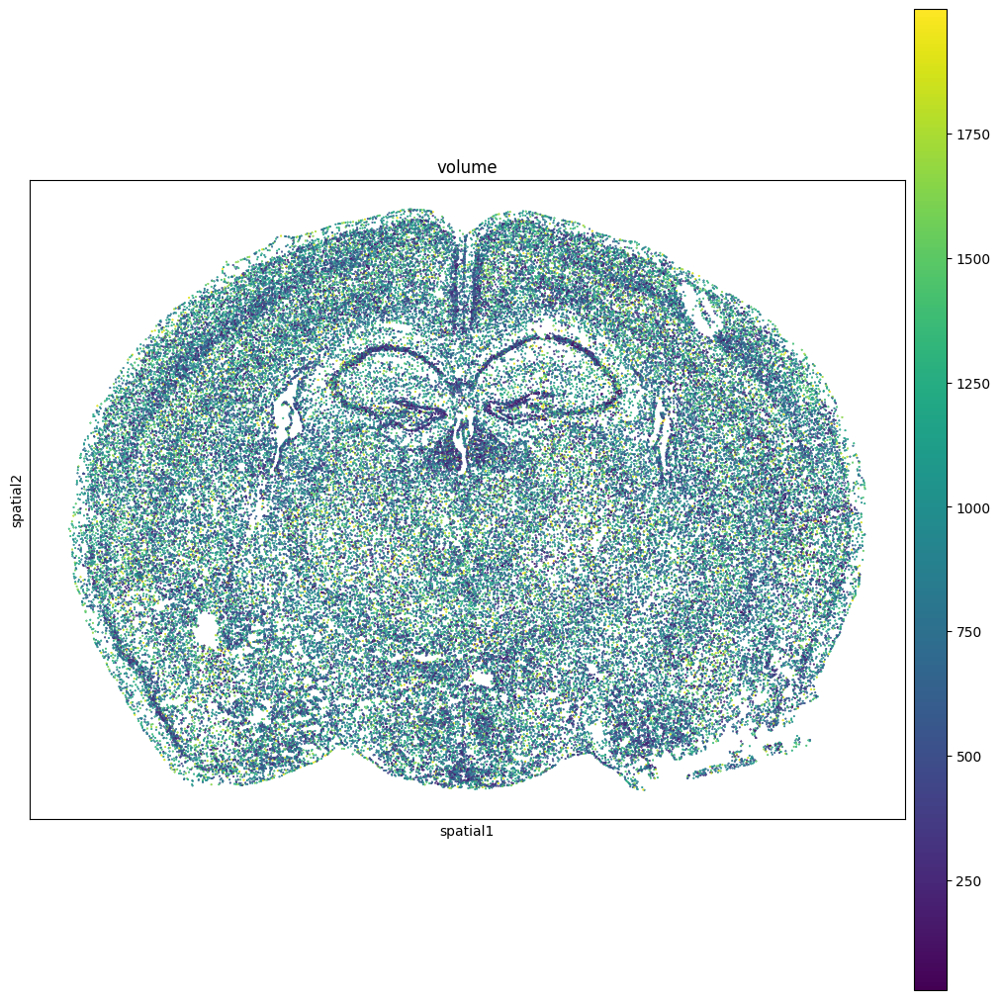

In [34]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="volume",
    size=0.5,
    library_id='spatial',
    figsize=(10, 10), 
)

In [35]:
adata.obsm['spatial']

array([[ 1805.87621104,  4272.3997802 ],
       [ 1742.45911599,  4208.66564206],
       [ 1758.90331343,  4256.47462343],
       ...,
       [10133.07528683,  1721.08467753],
       [10170.37140784,  1828.77105851],
       [10073.31233761,  1646.1952831 ]])

In [36]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [37]:
gene_sum = adata.to_df().apply(sum, 0)

In [38]:
cell_sum = adata.to_df().apply(sum,1)

In [39]:
adata.obs['library_size'] = cell_sum

<function matplotlib.pyplot.show(close=None, block=None)>

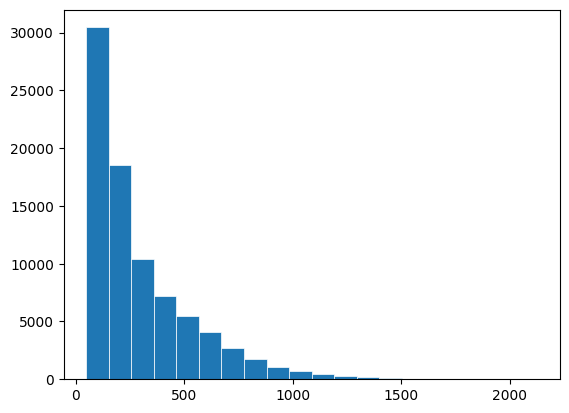

In [40]:
fig, ax = plt.subplots()

ax.hist(adata.obs['library_size'], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [41]:
import math

In [42]:
math.log(100,10)

2.0

In [43]:
type(adata.obs['library_size'])

pandas.core.series.Series

In [44]:
np.log2(adata.obs['library_size'])

0        6.807355
1        6.339850
2        6.169925
3        6.988685
4        5.882643
           ...   
83541    5.977280
83542    5.906891
83543    5.832890
83544    6.781360
83545    6.857981
Name: library_size, Length: 83546, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

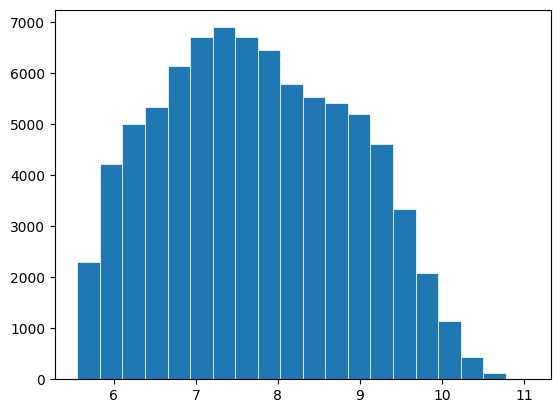

In [45]:
fig, ax = plt.subplots()

ax.hist(np.log2(adata.obs['library_size']), bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [46]:
adata.obs['log2_library_size'] = np.log2(adata.obs['library_size'])

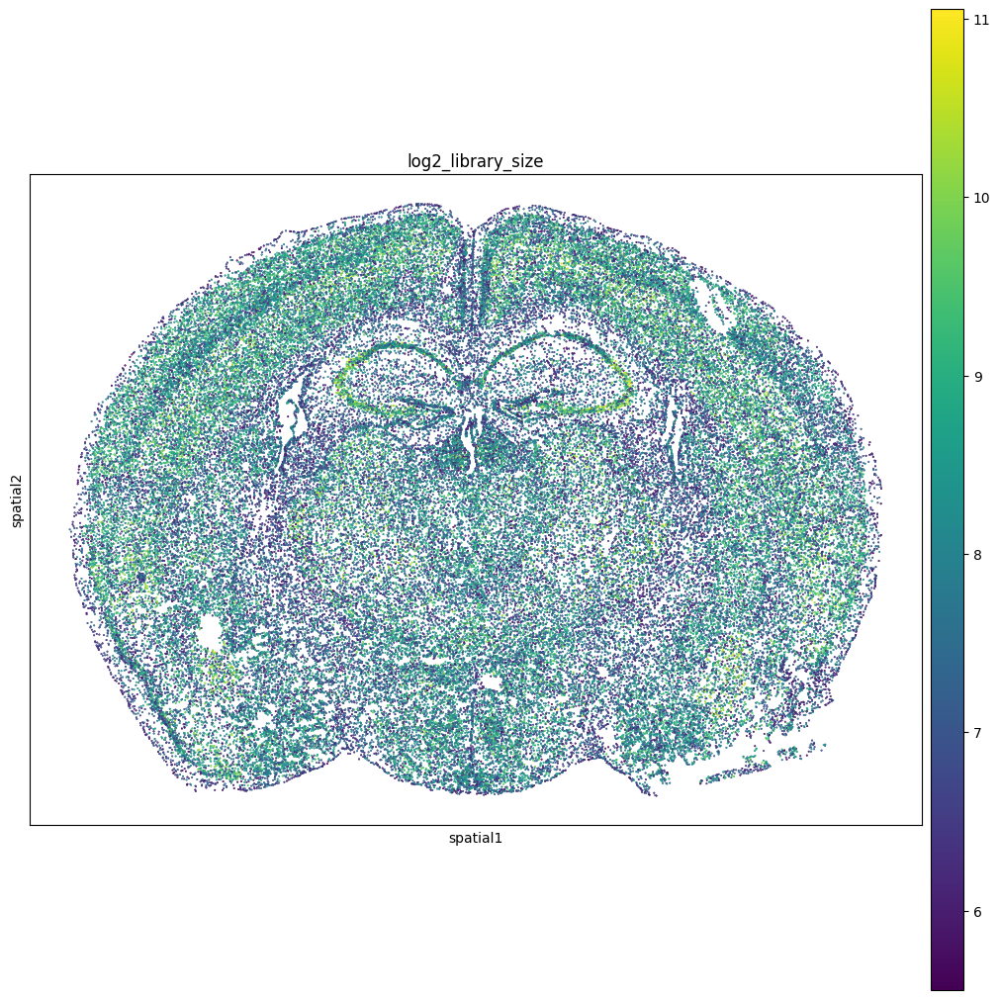

In [47]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="log2_library_size",
    size=0.5,
    library_id='spatial',
    figsize=(10, 10), 
)

In [48]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index', 'library_size', 'log2_library_size'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [49]:
adata.var['counts'] = gene_sum

In [50]:
np.std([1,1,1,1,1,2])

0.3726779962499649

In [51]:
np.std([1,1,1,1,1,1])

0.0

In [52]:
adata.var['var'] = adata.to_df().apply(np.std, 0)

In [53]:
adata.var['log10.counts'] = np.log10(adata.var['counts'])

<function matplotlib.pyplot.show(close=None, block=None)>

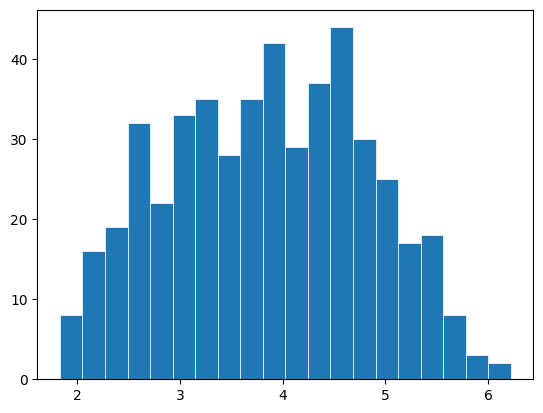

In [54]:
fig, ax = plt.subplots()

ax.hist(adata.var['log10.counts'], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [55]:
sum(adata.var['counts'] < 10)

0

In [56]:
sum(adata.obs['library_size'] < 2)

0

In [57]:
lr_pairs = pd.read_table('../data/mouse_lr_pair.txt', sep='\t')

In [58]:
adata.var.index

Index(['Oxgr1', 'Htr1a', 'Htr1b', 'Htr1d', 'Htr1f', 'Htr2a', 'Htr2b', 'Htr2c',
       'Htr4', 'Htr5a',
       ...
       'Pdgfrb', 'Ptk7', 'Ret', 'Ror1', 'Ror2', 'Ros1', 'Ryk', 'Tek', 'Tie1',
       'Tyro3'],
      dtype='object', length=483)

In [59]:
ligands = lr_pairs['ligand_gene_symbol'].unique()

In [60]:
receptors = lr_pairs['receptor_gene_symbol'].unique()

In [61]:
panel_genes = np.array(adata.var.index)

In [62]:
all_pairs = np.concatenate((ligands, receptors))

In [63]:
sum(np.isin(panel_genes, all_pairs))

209

In [64]:
lr_pairs['ligand_present'] = np.isin(lr_pairs['ligand_gene_symbol'],panel_genes)

In [65]:
lr_pairs['receptor_present'] = np.isin(lr_pairs['receptor_gene_symbol'], panel_genes)

In [66]:
lr_pairs['pair_present'] = lr_pairs['ligand_present'] & lr_pairs['receptor_present']

In [67]:
sum(lr_pairs['pair_present'])

16

In [68]:
adata.var['ligand'] = np.isin(adata.var.index, lr_pairs['ligand_gene_symbol'])

In [69]:
adata.var['receptor'] = np.isin(adata.var.index, lr_pairs['receptor_gene_symbol'])

In [70]:
sum(adata.var['ligand'] & adata.var['receptor'])

0

In [71]:
sum(adata.var['ligand'])

8

In [72]:
sum(adata.var['receptor'])

201

In [73]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index', 'library_size', 'log2_library_size'
    var: 'counts', 'var', 'log10.counts', 'ligand', 'receptor'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [74]:
sc.pp.filter_cells(adata, min_counts=2)

In [75]:
sc.pp.filter_genes(adata, min_cells = 10)

In [76]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index', 'library_size', 'log2_library_size', 'n_counts'
    var: 'counts', 'var', 'log10.counts', 'ligand', 'receptor', 'n_cells'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [77]:
adata.layers['raw_counts'] = adata.X.copy()

In [78]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [79]:
adata.layers['log1p_cpm'] = adata.X.copy()

In [80]:
adata.raw = adata

In [81]:
sc.pp.scale(adata, max_value = 10)

In [82]:
# adata.to_df().apply(sum,1)

In [83]:
# help(sc.pp.scale)

In [84]:
np.corrcoef(adata.var['var'], adata.var['std'])

array([[1.        , 0.72752053],
       [0.72752053, 1.        ]])

In [85]:
# help(np.corrcoef)

In [86]:
import scipy.stats

In [87]:
scipy.stats.spearmanr(adata.var['var'], adata.var['std'])

SignificanceResult(statistic=0.9693728605870043, pvalue=1.8559344524682568e-295)

We see a high correlation between the variance with the counts and the ?scaled data output

Dimenstionality Reduction + etc

In [88]:
# help(sc.tl.pca)

In [89]:
sc.tl.pca(adata, svd_solver = 'arpack')

In [90]:
adata.uns['pca']['variance_ratio'][0:9]

array([0.07340637, 0.03712247, 0.02968849, 0.02755612, 0.01952779,
       0.01792427, 0.0142842 , 0.01121029, 0.0096576 ])

In [91]:
range(1,10)

range(1, 10)

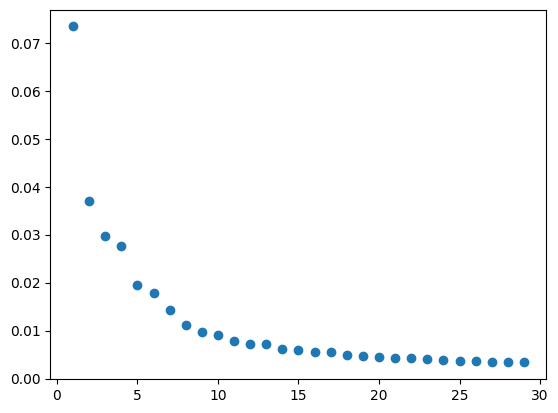

In [92]:
plt.scatter(x = range(1,30), y = adata.uns['pca']['variance_ratio'][0:29])

In [93]:
# help(sc.pp.neighbors)

In [94]:
sc.pp.neighbors(adata, n_neighbors = 10, n_pcs = 20)

In [95]:
# help(sc.tl.umap)

In [96]:
sc.tl.umap(adata)

In [97]:
adata.obsm['X_umap']

array([[ 4.928855  ,  9.076431  ],
       [ 1.7913544 ,  8.684152  ],
       [ 2.8904657 ,  9.052763  ],
       ...,
       [ 4.3439903 ,  8.114198  ],
       [ 0.77391934,  9.507335  ],
       [ 4.584645  , 14.529474  ]], dtype=float32)

In [98]:
# help(sc.tl.leiden)

In [99]:
sc.tl.leiden(adata, resolution = 1)

In [100]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index', 'library_size', 'log2_library_size', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10.counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

In [101]:
from collections import Counter

In [102]:
Counter(adata.obs['leiden'])

Counter({'0': 7954,
         '17': 1781,
         '8': 3685,
         '15': 2106,
         '4': 5928,
         '11': 2916,
         '10': 3017,
         '5': 4982,
         '24': 487,
         '13': 2737,
         '9': 3379,
         '20': 1234,
         '29': 302,
         '3': 6334,
         '2': 6349,
         '1': 7350,
         '19': 1276,
         '7': 4226,
         '12': 2748,
         '6': 4661,
         '26': 461,
         '28': 395,
         '14': 2271,
         '16': 1954,
         '21': 899,
         '22': 737,
         '27': 398,
         '18': 1649,
         '30': 73,
         '23': 730,
         '25': 477,
         '31': 50})

In [103]:
cell_by_gene = adata.to_df()

In [104]:
cell_by_gene.shape

(83546, 483)

Visualizations

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


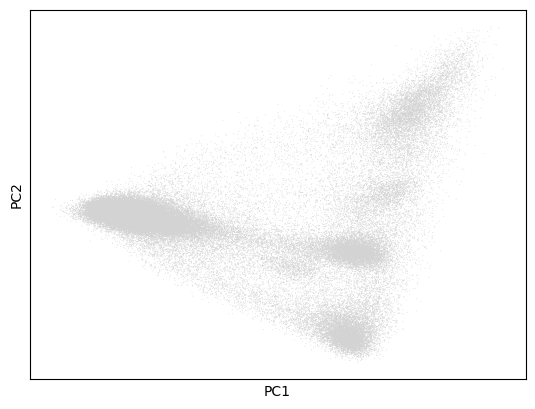

In [105]:
sc.pl.pca(adata)

In [106]:
# help(sc.pl.pca)

In [107]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index', 'library_size', 'log2_library_size', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10.counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


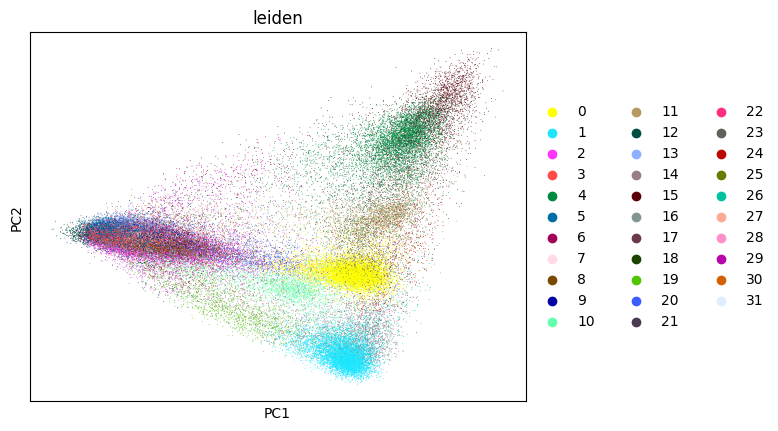

In [108]:
sc.pl.pca(adata, color = 'leiden')

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


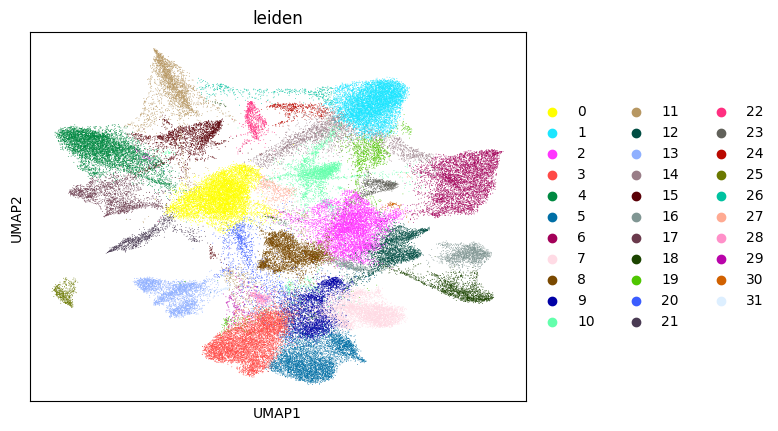

In [109]:
sc.pl.umap(adata, color = 'leiden')

In [110]:
adata.obsm['X_umap']

array([[ 4.928855  ,  9.076431  ],
       [ 1.7913544 ,  8.684152  ],
       [ 2.8904657 ,  9.052763  ],
       ...,
       [ 4.3439903 ,  8.114198  ],
       [ 0.77391934,  9.507335  ],
       [ 4.584645  , 14.529474  ]], dtype=float32)

In [111]:
import seaborn as sns

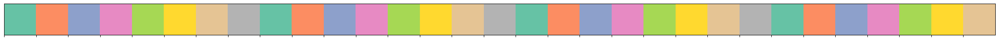

In [112]:
sns.palplot(sns.color_palette('Set2',31))

In [113]:
color_labels = adata.obs['leiden'].unique()
rgb_values = sns.color_palette('Set2',31)
color_map = dict(zip(color_labels, rgb_values))


In [114]:
# adata.obs['leiden'].map(color_map)

In [115]:
np.isin(adata.obs['leiden'][0], color_map.keys())

array(False)

In [116]:
adata.obs['leiden'][0]

'0'

In [117]:
color_map[adata.obs['leiden'][0]]

(0.4, 0.7607843137254902, 0.6470588235294118)

In [118]:
adata.obs['leiden']

0         0
1        17
2        17
3        17
4        17
         ..
83541    17
83542    17
83543     0
83544    17
83545    15
Name: leiden, Length: 83546, dtype: category
Categories (32, object): ['0', '1', '2', '3', ..., '28', '29', '30', '31']

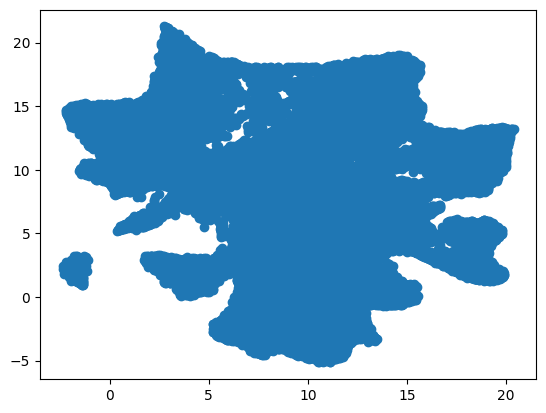

In [119]:
plt.scatter(x = [subarray[0] for subarray in adata.obsm['X_umap']],
            y = [subarray[1] for subarray in adata.obsm['X_umap']],
            # c = adata.obs['leiden'].map(color_map)
           )

Finding cluster marker genessc.tl.rank_genes_groups

In [121]:
help(sc.tl.rank_genes_groups)

Help on function rank_genes_groups in module scanpy.tools._rank_genes_groups:

rank_genes_groups(adata: anndata._core.anndata.AnnData, groupby: str, use_raw: Optional[bool] = None, groups: Union[Literal['all'], Iterable[str]] = 'all', reference: str = 'rest', n_genes: Optional[int] = None, rankby_abs: bool = False, pts: bool = False, key_added: Optional[str] = None, copy: bool = False, method: Optional[Literal['logreg', 't-test', 'wilcoxon', 't-test_overestim_var']] = None, corr_method: Literal['benjamini-hochberg', 'bonferroni'] = 'benjamini-hochberg', tie_correct: bool = False, layer: Optional[str] = None, **kwds) -> Optional[anndata._core.anndata.AnnData]
    Rank genes for characterizing groups.
    
    Expects logarithmized data.
    
    Parameters
    ----------
    adata
        Annotated data matrix.
    groupby
        The key of the observations grouping to consider.
    use_raw
        Use `raw` attribute of `adata` if present.
    layer
        Key from `adata.layers` who

In [123]:
sc.tl.rank_genes_groups(adata, 'leiden', method = 'wilcoxon')

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly 

In [124]:
adata

AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'original_index', 'library_size', 'log2_library_size', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10.counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

In [125]:
adata.uns['leiden']

{'params': {'resolution': 1, 'random_state': 0, 'n_iterations': -1}}

In [128]:
adata.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [134]:
len(adata.uns['rank_genes_groups']['scores'][0])

32

In [135]:
len(adata.uns['rank_genes_groups']['scores'])

483

In [137]:
adata.uns['rank_genes_groups']['pvals_adj'][0]

(0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.00225391e-216, 0., 0., 0., 4.36887594e-197, 3.31144101e-301, 6.91353903e-244, 8.36028247e-151, 1.86960255e-178, 5.15350604e-120, 3.67836881e-44, 1.73990382e-26)

In [140]:
adata.uns['rank_genes_groups']['scores'][0]

(143.17621, 138.41632, 82.0626, 111.579506, 125.93478, 84.6458, 110.95594, 93.4002, 95.206924, 85.486244, 88.76218, 90.0246, 71.97199, 79.750015, 64.913536, 75.94451, 68.865814, 59.439507, 68.56989, 46.10061, 31.61821, 45.318848, 46.005898, 46.007355, 30.155647, 37.261677, 33.53619, 26.39116, 28.699497, 23.55689, 14.373263, 11.210969)

In [141]:
adata.uns['rank_genes_groups']['names'][0]

('Ntsr2', 'Gjc3', 'Gad1', 'Lmtk2', 'Flt1', 'Chrm1', 'Grm4', 'Sstr4', 'Gad1', 'Slc17a7', 'Gpr17', 'C1qb', 'Slc17a6', 'Epha7', 'Gjc3', 'Atp13a5', 'Drd1', 'Arhgap29', 'Adora2a', 'Gjc3', 'Slc17a7', 'Sox9', 'Gabbr1', 'Gad1', 'Flt1', 'Htr2c', 'C1qb', 'Slc25a18', 'Gpr26', 'Flt1', 'Chat', 'Gpr101')

In [ ]:
adata.uns['rank_genes_groups']['names'][0]

('Gpr37l1', 'Gprc5b', 'Slc32a1', 'Gpr158', 'Cldn5', 'Grin2b', 'Slc17a6', 'Slc17a7', 'Erbb4', 'Sstr2', 'Pdgfra', 'C1qa', 'Fzd3', 'Epha4', 'Gprc5b', 'Pdgfrb', 'Gpr88', 'Fn1', 'Drd2', 'Olig1', 'Ntsr2', 'Cxcr4', 'Gpr151', 'Slc32a1', 'Gjc3', 'Tmem108', 'C1qa', 'Gpr37l1', 'Adora1', 'Cldn5', 'Ntrk1', 'Trhr')

In [148]:
adata.uns['rank_genes_groups']['names'][0]

('Ntsr2', 'Gjc3', 'Gad1', 'Lmtk2', 'Flt1', 'Chrm1', 'Grm4', 'Sstr4', 'Gad1', 'Slc17a7', 'Gpr17', 'C1qb', 'Slc17a6', 'Epha7', 'Gjc3', 'Atp13a5', 'Drd1', 'Arhgap29', 'Adora2a', 'Gjc3', 'Slc17a7', 'Sox9', 'Gabbr1', 'Gad1', 'Flt1', 'Htr2c', 'C1qb', 'Slc25a18', 'Gpr26', 'Flt1', 'Chat', 'Gpr101')

In [143]:
adata.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [144]:
adata.uns['rank_genes_groups']['params']

{'groupby': 'leiden',
 'reference': 'rest',
 'method': 'wilcoxon',
 'use_raw': True,
 'layer': None,
 'corr_method': 'benjamini-hochberg'}

In [ ]:
# [subarray[0] for subarray in adata.obsm['X_umap']]

In [149]:
gene_order_question = [subarray[0] for subarray in adata.uns['rank_genes_groups']['names']]

In [156]:
len(set(gene_order_question))

483

In [159]:
help(sc.pl.rank_genes_groups_dotplot)

Help on function rank_genes_groups_dotplot in module scanpy.plotting._tools:

rank_genes_groups_dotplot(adata: anndata._core.anndata.AnnData, groups: Union[str, Sequence[str]] = None, n_genes: Optional[int] = None, groupby: Optional[str] = None, values_to_plot: Optional[Literal['scores', 'logfoldchanges', 'pvals', 'pvals_adj', 'log10_pvals', 'log10_pvals_adj']] = None, var_names: Union[Sequence[str], Mapping[str, Sequence[str]], NoneType] = None, gene_symbols: Optional[str] = None, min_logfoldchange: Optional[float] = None, key: Optional[str] = None, show: Optional[bool] = None, save: Optional[bool] = None, return_fig: Optional[bool] = False, **kwds)
    Plot ranking of genes using dotplot plot (see :func:`~scanpy.pl.dotplot`)
    
    Parameters
    ----------
    adata
        Annotated data matrix.
    groups
        The groups for which to show the gene ranking.
    n_genes
        Number of genes to show. This can be a negative number to show for
        example the down regulated

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


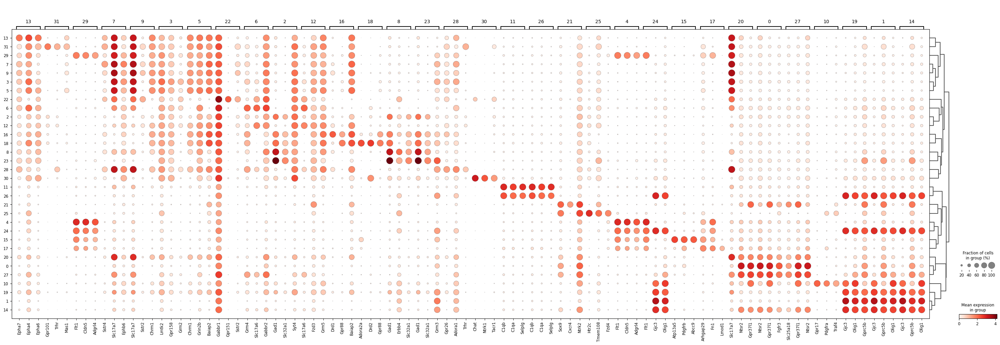

In [160]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3)

In [161]:
adata.uns['rank_genes_groups']['names'][0]

('Ntsr2', 'Gjc3', 'Gad1', 'Lmtk2', 'Flt1', 'Chrm1', 'Grm4', 'Sstr4', 'Gad1', 'Slc17a7', 'Gpr17', 'C1qb', 'Slc17a6', 'Epha7', 'Gjc3', 'Atp13a5', 'Drd1', 'Arhgap29', 'Adora2a', 'Gjc3', 'Slc17a7', 'Sox9', 'Gabbr1', 'Gad1', 'Flt1', 'Htr2c', 'C1qb', 'Slc25a18', 'Gpr26', 'Flt1', 'Chat', 'Gpr101')

In [162]:
len(set(adata.uns['rank_genes_groups']['names'][0]))

24

In [163]:
len((adata.uns['rank_genes_groups']['names'][0]))

32

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


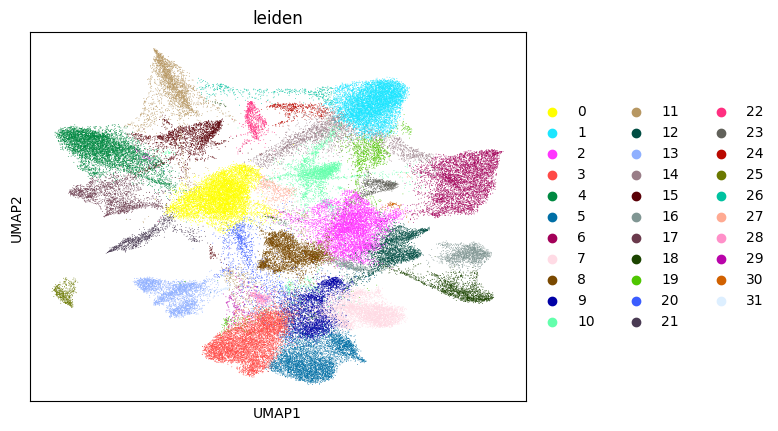

In [164]:
sc.pl.umap(adata, color = 'leiden')

In [165]:
adata.obs['one_nineteen_fourteen'] = np.isin(adata.obs['leiden'], [1,19,14])

In [201]:
adata.obs['one_19_14'] = [i if np.isin(i,['1','19','14']) else '' for i in adata.obs['leiden']]

In [204]:
Counter(adata.obs['one_19_14'])

Counter({'': 72649, '1': 7350, '19': 1276, '14': 2271})

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


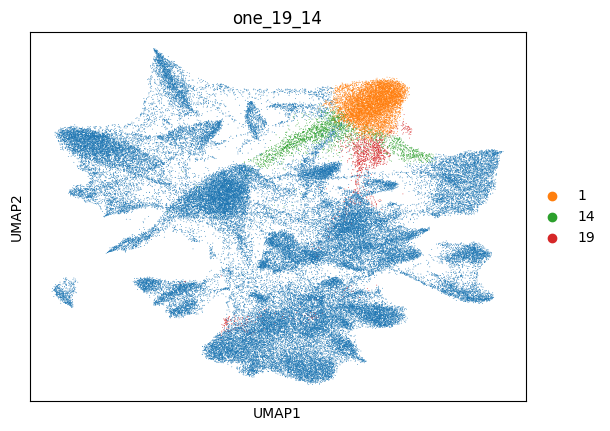

In [205]:
sc.pl.umap(adata, color = 'one_19_14')

In [209]:
adata.uns['rank_genes_groups']['names'][0:2]

rec.array([('Ntsr2', 'Gjc3', 'Gad1', 'Lmtk2', 'Flt1', 'Chrm1', 'Grm4', 'Sstr4', 'Gad1', 'Slc17a7', 'Gpr17', 'C1qb', 'Slc17a6', 'Epha7', 'Gjc3', 'Atp13a5', 'Drd1', 'Arhgap29', 'Adora2a', 'Gjc3', 'Slc17a7', 'Sox9', 'Gabbr1', 'Gad1', 'Flt1', 'Htr2c', 'C1qb', 'Slc25a18', 'Gpr26', 'Flt1', 'Chat', 'Gpr101'),
           ('Gpr37l1', 'Gprc5b', 'Slc32a1', 'Gpr158', 'Cldn5', 'Grin2b', 'Slc17a6', 'Slc17a7', 'Erbb4', 'Sstr2', 'Pdgfra', 'C1qa', 'Fzd3', 'Epha4', 'Gprc5b', 'Pdgfrb', 'Gpr88', 'Fn1', 'Drd2', 'Olig1', 'Ntsr2', 'Cxcr4', 'Gpr151', 'Slc32a1', 'Gjc3', 'Tmem108', 'C1qa', 'Gpr37l1', 'Adora1', 'Cldn5', 'Ntrk1', 'Trhr')],
          dtype=[('0', 'O'), ('1', 'O'), ('2', 'O'), ('3', 'O'), ('4', 'O'), ('5', 'O'), ('6', 'O'), ('7', 'O'), ('8', 'O'), ('9', 'O'), ('10', 'O'), ('11', 'O'), ('12', 'O'), ('13', 'O'), ('14', 'O'), ('15', 'O'), ('16', 'O'), ('17', 'O'), ('18', 'O'), ('19', 'O'), ('20', 'O'), ('21', 'O'), ('22', 'O'), ('23', 'O'), ('24', 'O'), ('25', 'O'), ('26', 'O'), ('27', 'O'), ('28', 'O

In [213]:
gene_order_question = [subarray[1] for subarray in adata.uns['rank_genes_groups']['names'][0:3]]

In [214]:
gene_order_question

['Gjc3', 'Gprc5b', 'Olig1']

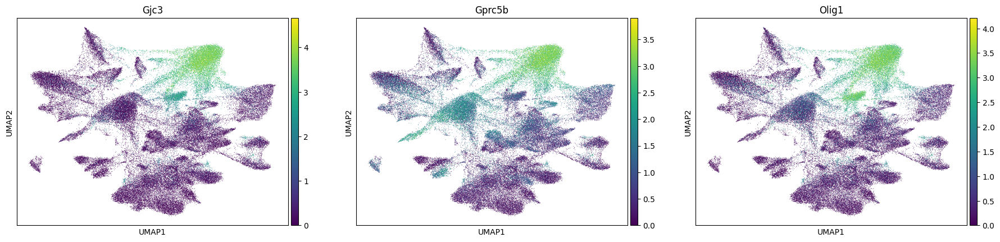

In [215]:
sc.pl.umap(adata, color = gene_order_question)

In [220]:
for i in lr_pairs[lr_pairs['pair_present'] == True]:
    print(i)

lr_pair
ligand_gene_symbol
receptor_gene_symbol
ligand_gene_id
receptor_gene_id
ligand_ensembl_protein_id
receptor_ensembl_protein_id
ligand_ensembl_gene_id
receptor_ensembl_gene_id
evidence
ligand_present
receptor_present
pair_present


In [221]:
lr_pairs_present = lr_pairs[lr_pairs['pair_present'] == True]

Ligand: Sema4d, and receptor: Erbb2


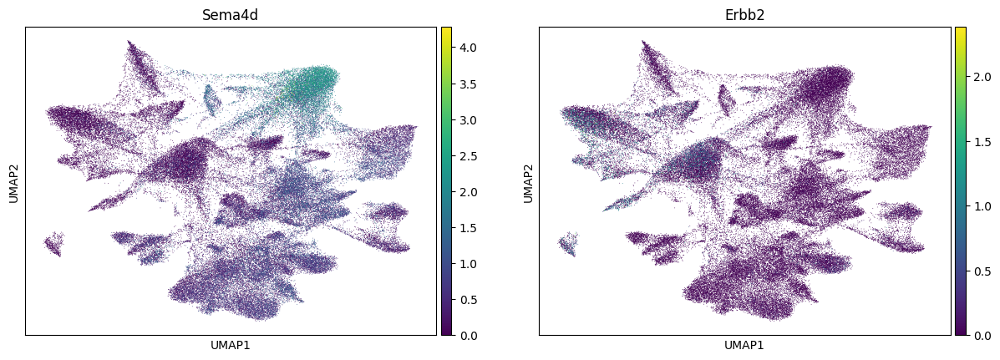

None
Ligand: Sema4d, and receptor: Met


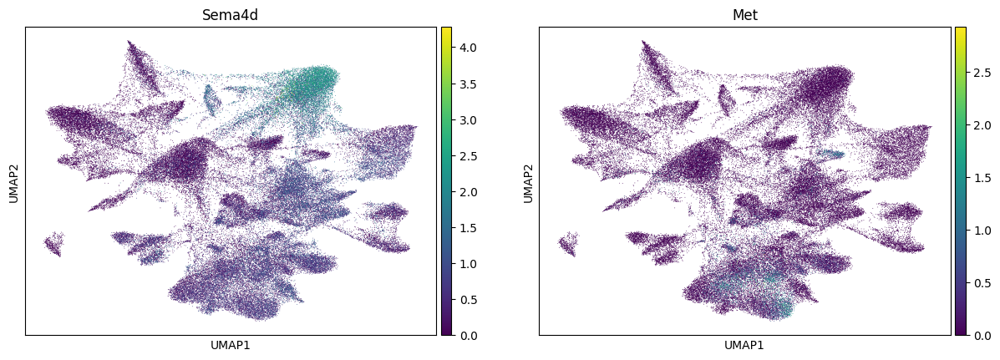

None
Ligand: Cx3cl1, and receptor: Cx3cr1


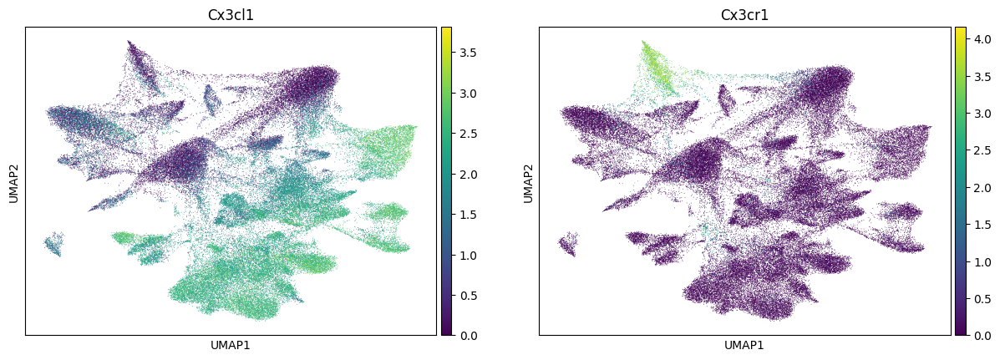

None
Ligand: Cxcl12, and receptor: Oprm1


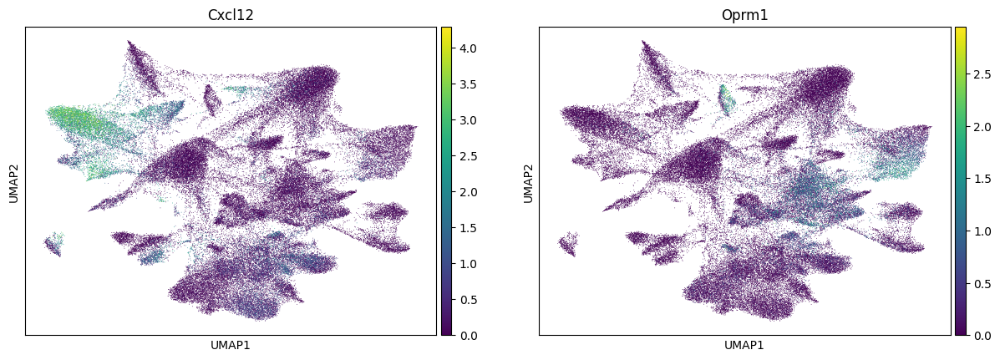

None
Ligand: Selplg, and receptor: Cxcr2


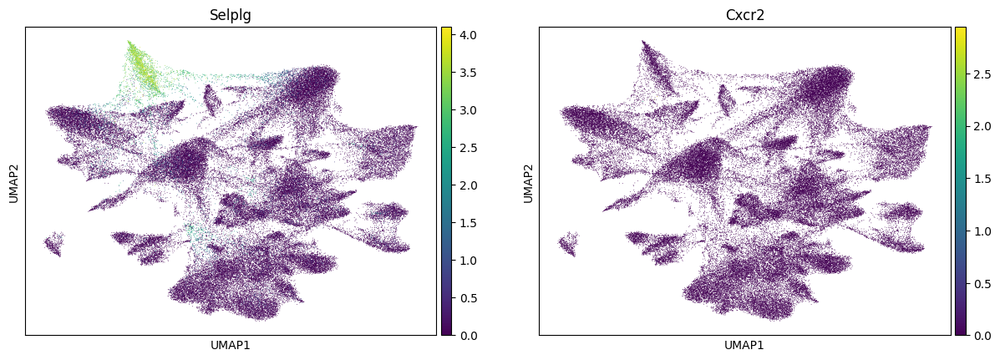

None
Ligand: Cxcl12, and receptor: Avpr1a


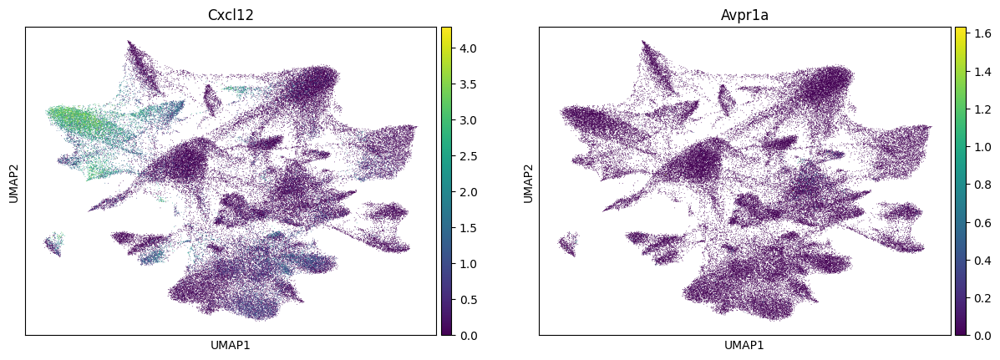

None
Ligand: Rspo3, and receptor: Lgr5


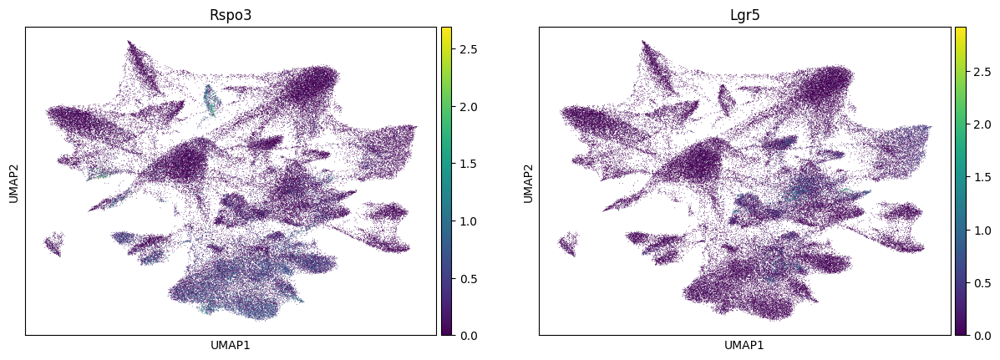

None
Ligand: Rspo3, and receptor: Lgr6


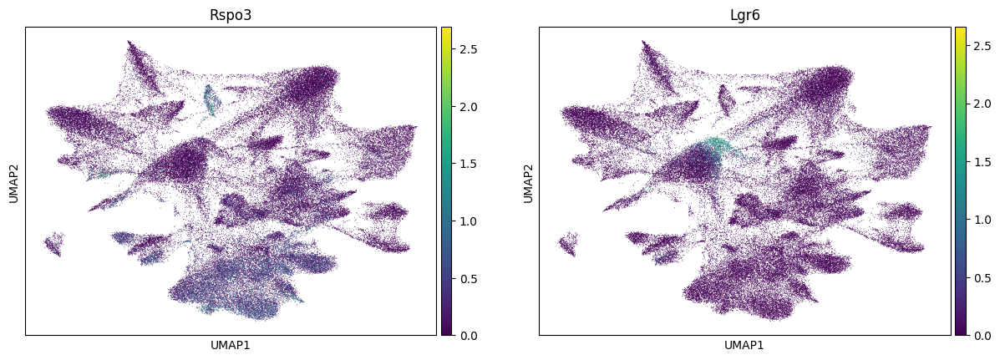

None
Ligand: Cxcl12, and receptor: Cmklr1


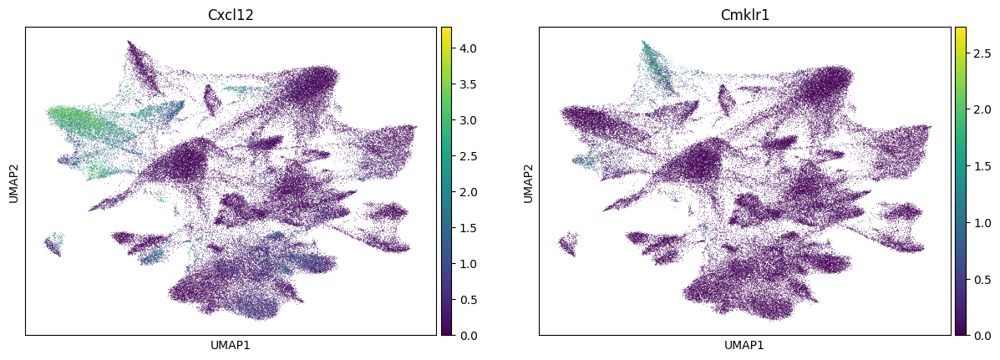

None
Ligand: Rspo3, and receptor: Fzd8


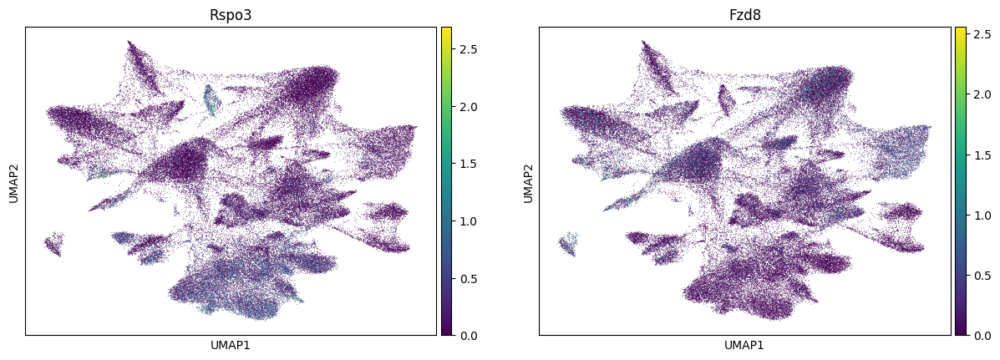

None
Ligand: Rspo3, and receptor: Lgr4


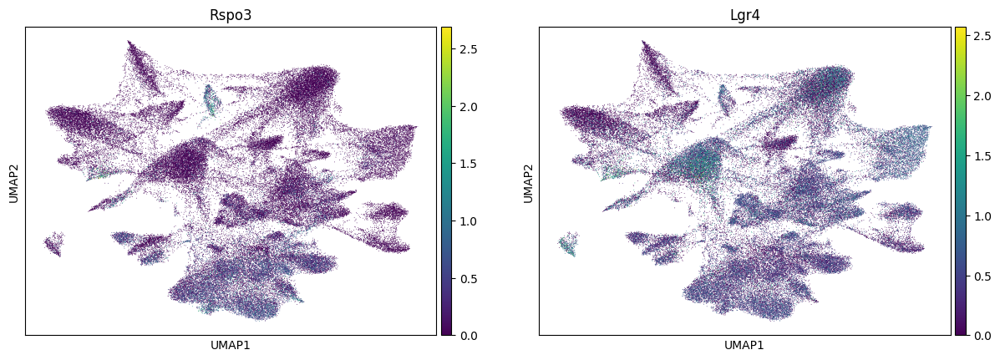

None
Ligand: Cxcl12, and receptor: Oprd1


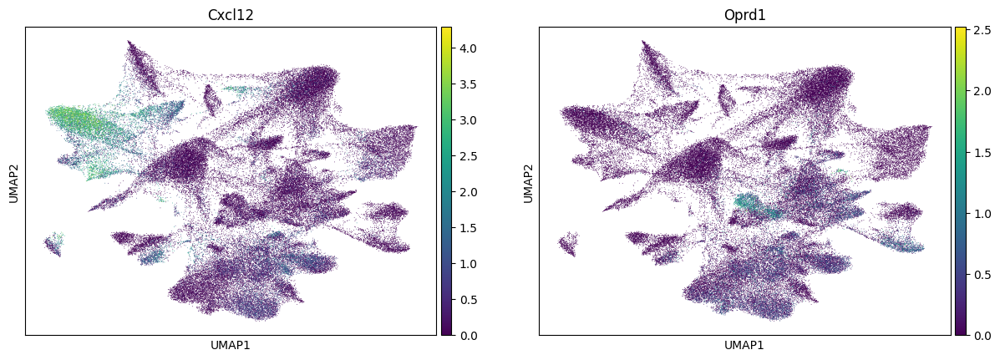

None
Ligand: Cxcl12, and receptor: Cxcr4


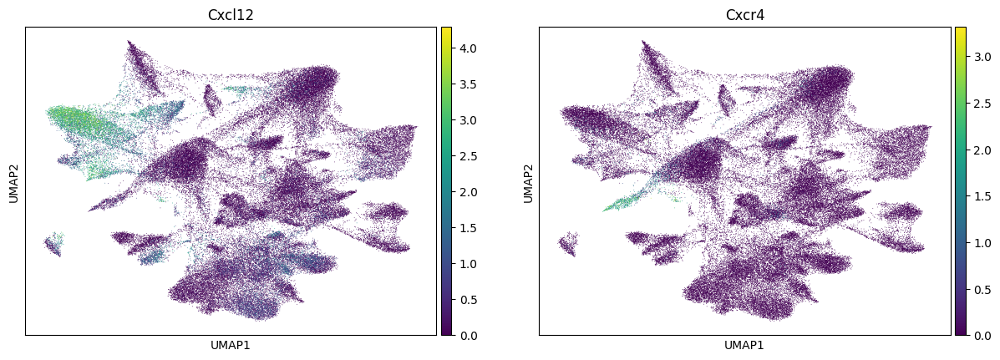

None
Ligand: Cxcl12, and receptor: Gpr17


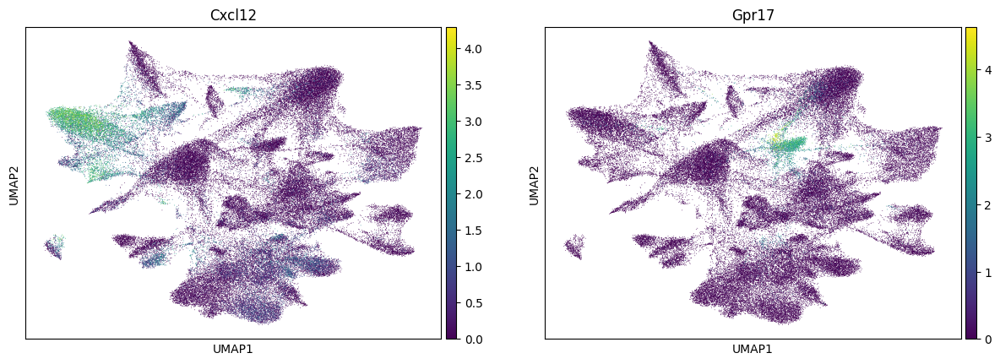

None
Ligand: Cxcl12, and receptor: Ackr3


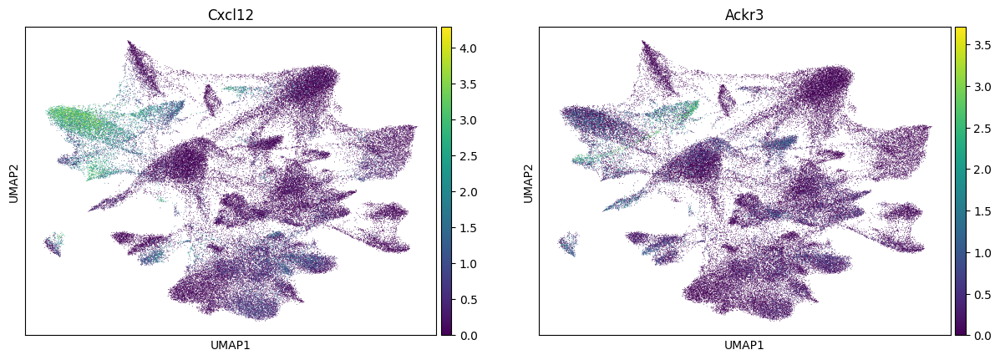

None
Ligand: Cxcl12, and receptor: Agtr1a


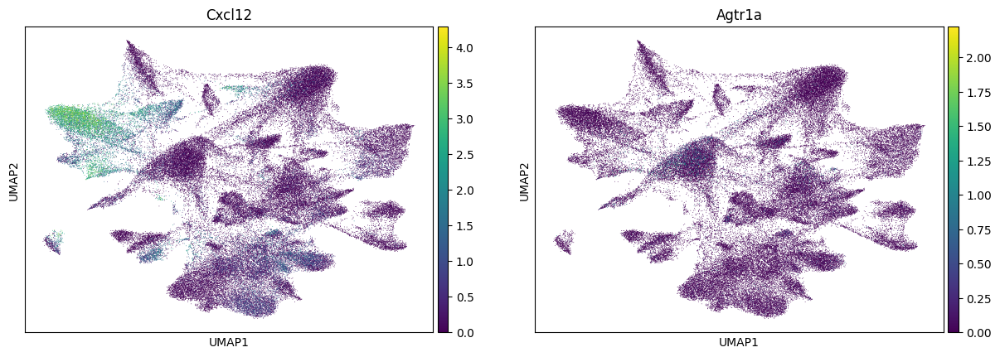

None


In [226]:
for index, row in lr_pairs_present.iterrows():
    ligand = row['ligand_gene_symbol']
    receptor = row['receptor_gene_symbol']
    
    print(f"Ligand: {ligand}, and receptor: {receptor}")
    
    print(sc.pl.umap(adata, color= [ligand,receptor]))

In [227]:

import pickle

In [228]:
with open('../data/mouse_brain_showcase/scanpy_object.pickle','wb') as f:
    pickle.dump(adata,f)

In [229]:
with open('../data/mouse_brain_showcase/lr_pairs.pickle','wb') as f:
    pickle.dump(lr_pairs_present,f)